# Import Libraries

In [1]:
import torch
import torch.nn.functional as F
import pdb
from torch.optim import Adam
from torch.utils.data import DataLoader
import argparse
from PIL import Image
import pytorch_lightning as pl
from omegaconf import OmegaConf
from torch import nn
import numpy as np
from Inswapper import Inswapper128_Pytorch, ArcFace_encoder
import onnx
from onnx2torch import convert
import os
import matplotlib.pyplot as plt
from torchvision import transforms
import numpy as np
from glob import glob
import cv2
import onnxruntime as rt

In [2]:
def normalize_by_127_5(img):
    """
    Normalize a tensor image by dividing by its maximum value.

    Args:
        img (torch.Tensor): Input image tensor.

    Returns:
        torch.Tensor: Normalized image tensor with values in [0, 1].
    """
    img = (img * 255.0).int()
    return (img / 127.5) - 1.0  # Return unchanged if max is 0 (e.g., all-zero image)


def get_imgfiles(path):
    files = []
    for ext in ('*.gif', '*.png', '*.jpg'):
        files.extend(glob(os.path.join(path, ext)))
    return files

# Arcface (Pytorch)

In [3]:
arcface =  ArcFace_encoder(ema_path='./emp.npy')
arcface.resnet.load_state_dict(torch.load('./arcface_w600k_r50_pytorch.pt', map_location=torch.device('cuda')))
arcface = arcface.cuda()
arcface.eval()

ArcFace_encoder(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (prelu): PReLU(num_parameters=64)
    (layer1): Sequential(
      (0): FaceBottleneck(
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (prelu): PReLU(num_parameters=64)
        (downsample): Conv2d(64, 64, kernel_size=(1, 1), stride=(2, 2))
      )
      (1): FaceBottleneck(
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (prelu): PReLU(num_parameters=64)
      )
      (2): FaceBottleneck(
        (bn1): BatchNorm2d(64, eps=1e-05, mome

# Inswapper (Pytorch)

In [4]:
torch_inswapper = Inswapper128_Pytorch(512)
torch_inswapper.load_state_dict(torch.load('./inswapper_128.pt',weights_only=True), strict=False)
torch_inswapper = torch_inswapper.cuda()
torch_inswapper.eval()

Inswapper128_Pytorch(
  (E): Fusion_Encoder(
    (Encoder): ModuleDict(
      (layer_0): Sequential(
        (0): Conv2d(3, 128, kernel_size=(7, 7), stride=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (layer_1): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (layer_2): Sequential(
        (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (layer_3): Sequential(
        (0): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
    )
    (fusion_module): ModuleDict(
      (fusion_layer_0): Feature_Fusion_Block(
        (OP1): Operation_Unit(
          (Conv1): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1))
          (activation): ReLU()
          (IIM): Identity_Injection_Module(
            (fc): Linear(in_features=

# Transformation definitions for arcface and swapper. 

In [5]:
t_transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor()
])

s_transform =transforms.Compose([
        transforms.Resize((112, 112)),
        transforms.ToTensor(),
        transforms.Lambda(normalize_by_127_5)
    ])

# Run examples

torch.Size([1, 3, 128, 128])


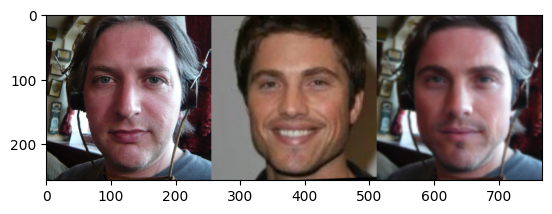

torch.Size([1, 3, 128, 128])


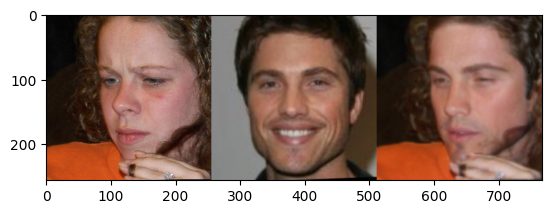

torch.Size([1, 3, 128, 128])


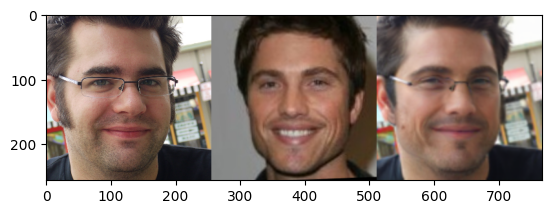

torch.Size([1, 3, 128, 128])


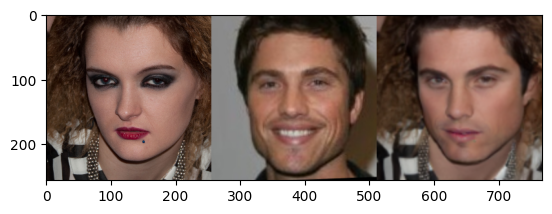

torch.Size([1, 3, 128, 128])


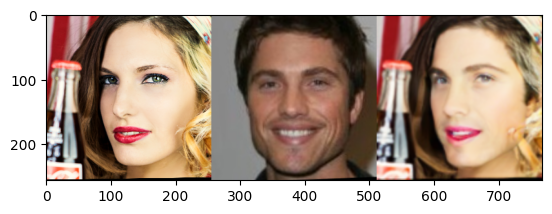

torch.Size([1, 3, 128, 128])


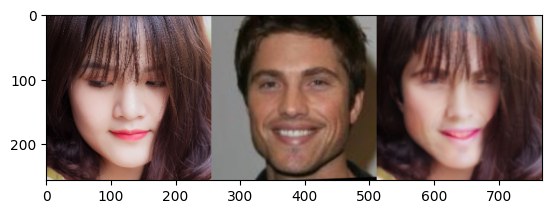

torch.Size([1, 3, 128, 128])


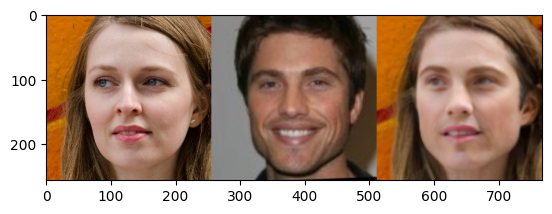

torch.Size([1, 3, 128, 128])


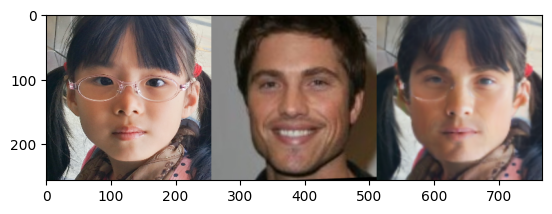

torch.Size([1, 3, 128, 128])


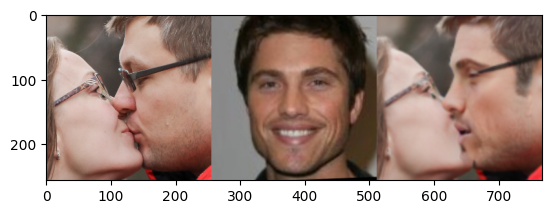

torch.Size([1, 3, 128, 128])


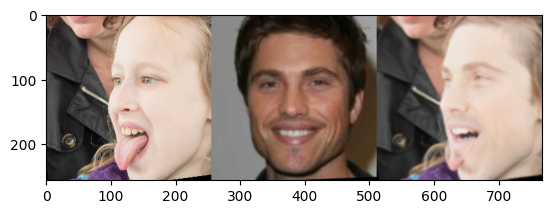

torch.Size([1, 3, 128, 128])


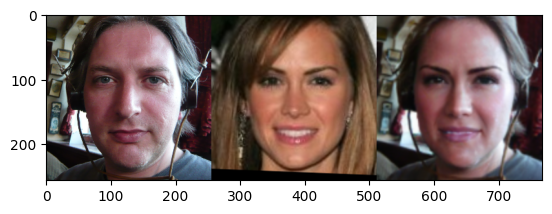

torch.Size([1, 3, 128, 128])


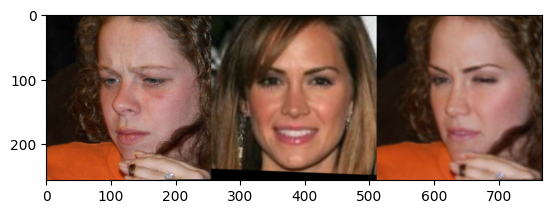

torch.Size([1, 3, 128, 128])


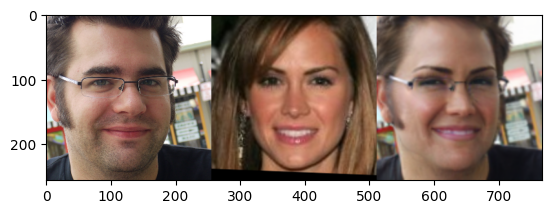

torch.Size([1, 3, 128, 128])


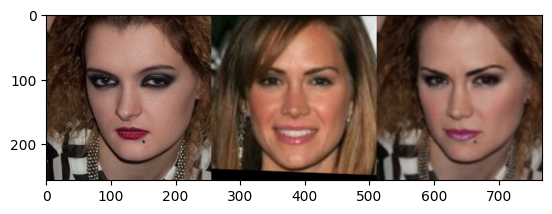

torch.Size([1, 3, 128, 128])


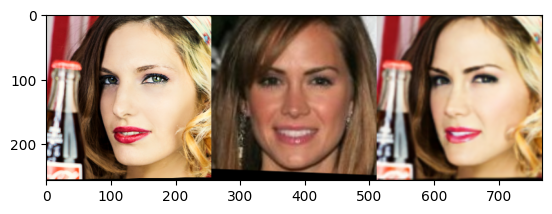

torch.Size([1, 3, 128, 128])


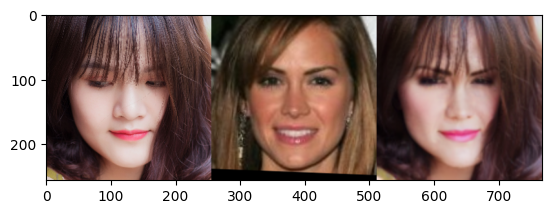

torch.Size([1, 3, 128, 128])


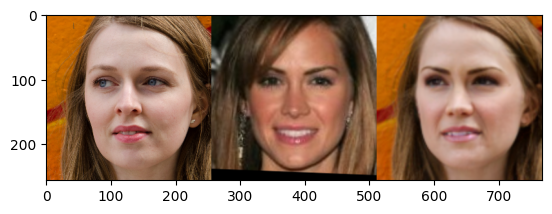

torch.Size([1, 3, 128, 128])


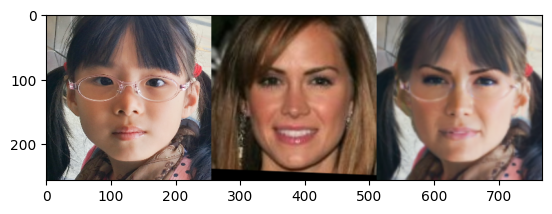

torch.Size([1, 3, 128, 128])


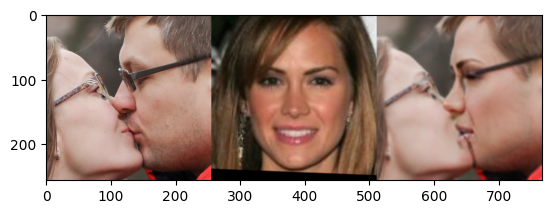

torch.Size([1, 3, 128, 128])


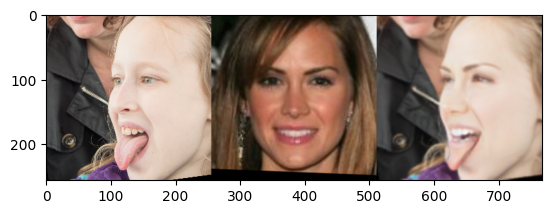

torch.Size([1, 3, 128, 128])


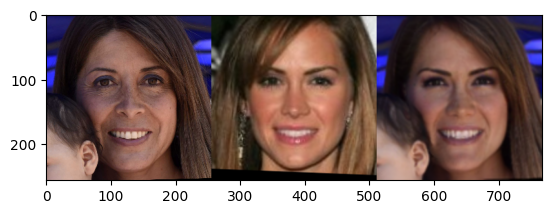

torch.Size([1, 3, 128, 128])


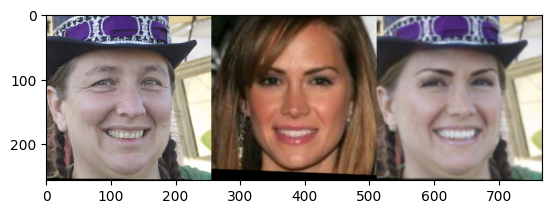

torch.Size([1, 3, 128, 128])


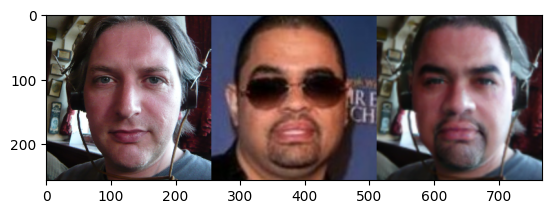

torch.Size([1, 3, 128, 128])


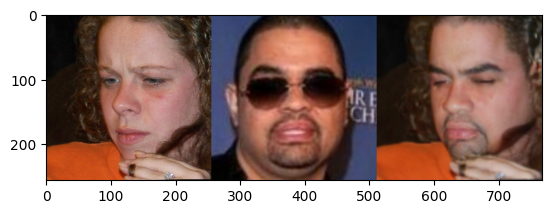

torch.Size([1, 3, 128, 128])


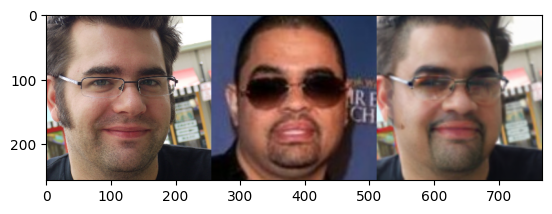

torch.Size([1, 3, 128, 128])


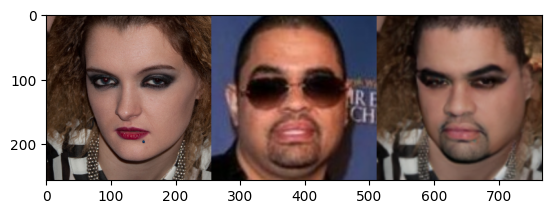

torch.Size([1, 3, 128, 128])


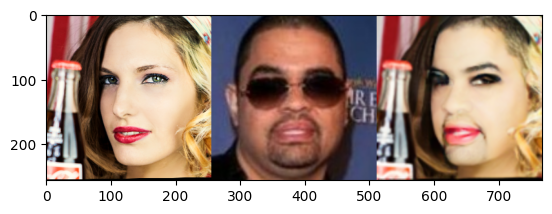

torch.Size([1, 3, 128, 128])


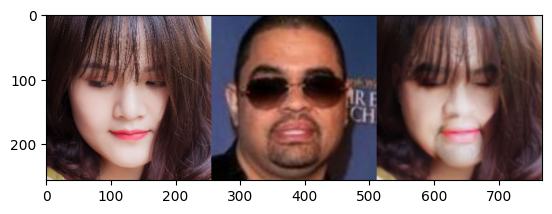

torch.Size([1, 3, 128, 128])


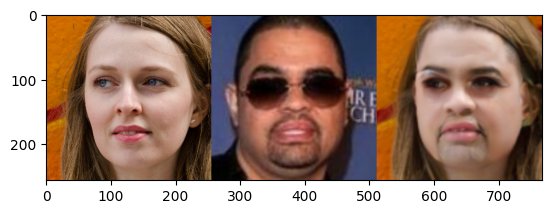

torch.Size([1, 3, 128, 128])


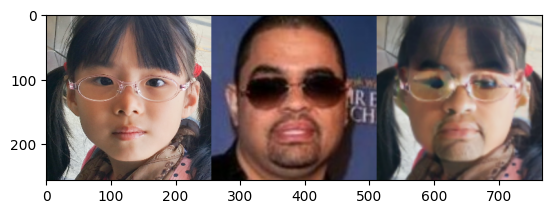

torch.Size([1, 3, 128, 128])


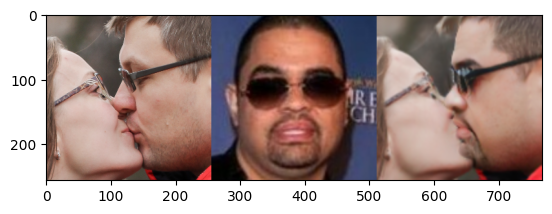

torch.Size([1, 3, 128, 128])


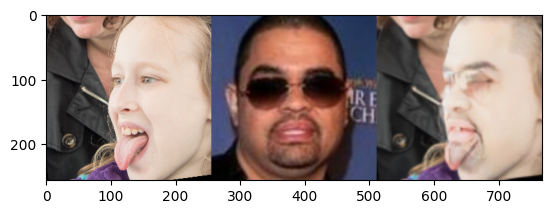

torch.Size([1, 3, 128, 128])


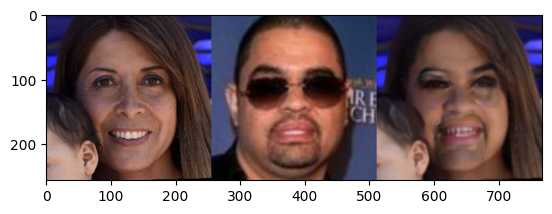

torch.Size([1, 3, 128, 128])


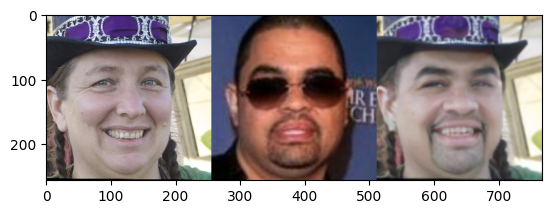

torch.Size([1, 3, 128, 128])


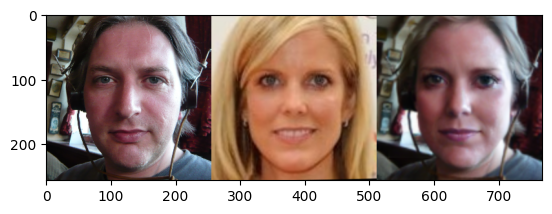

torch.Size([1, 3, 128, 128])


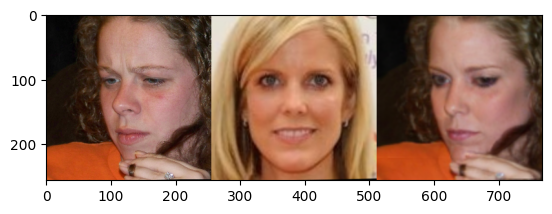

torch.Size([1, 3, 128, 128])


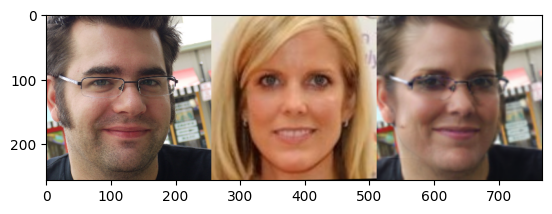

torch.Size([1, 3, 128, 128])


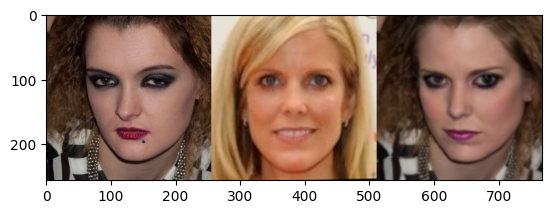

torch.Size([1, 3, 128, 128])


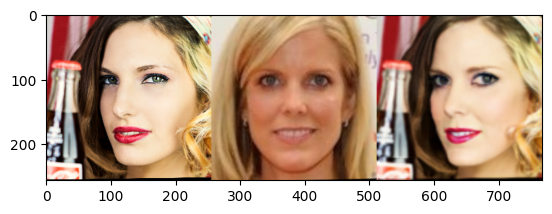

torch.Size([1, 3, 128, 128])


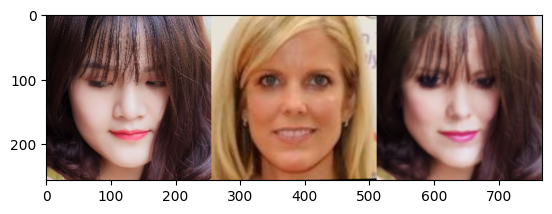

torch.Size([1, 3, 128, 128])


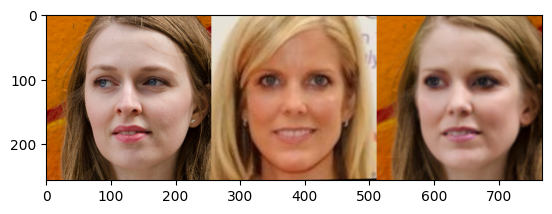

torch.Size([1, 3, 128, 128])


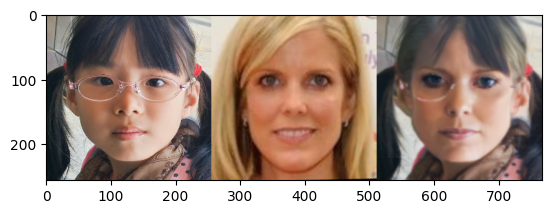

torch.Size([1, 3, 128, 128])


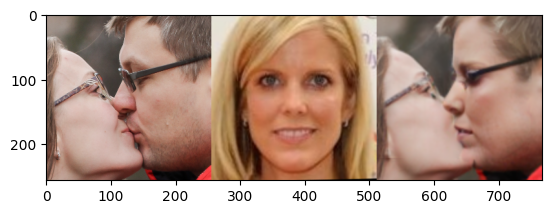

torch.Size([1, 3, 128, 128])


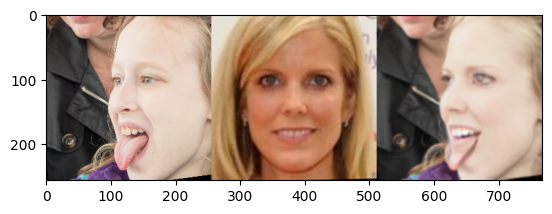

torch.Size([1, 3, 128, 128])


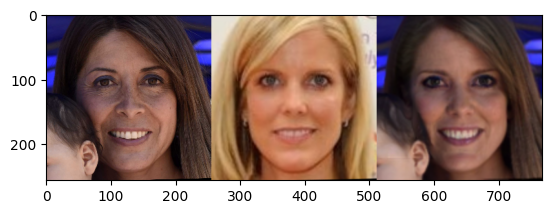

torch.Size([1, 3, 128, 128])


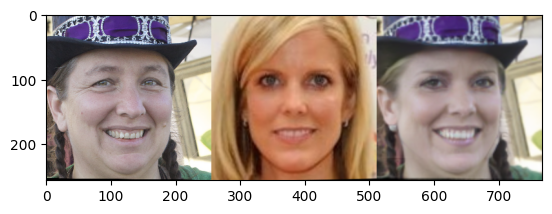

torch.Size([1, 3, 128, 128])


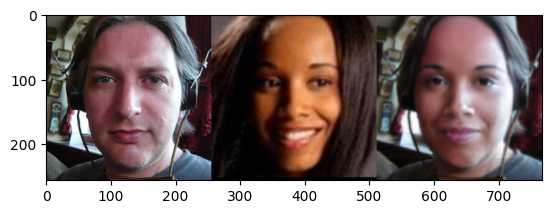

torch.Size([1, 3, 128, 128])


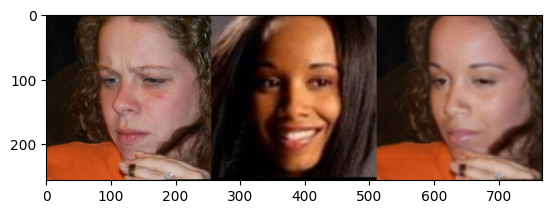

torch.Size([1, 3, 128, 128])


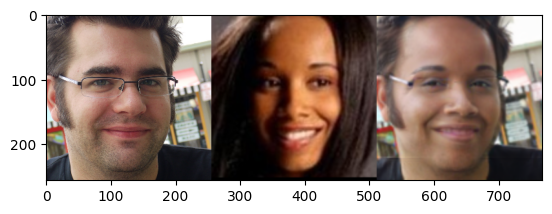

torch.Size([1, 3, 128, 128])


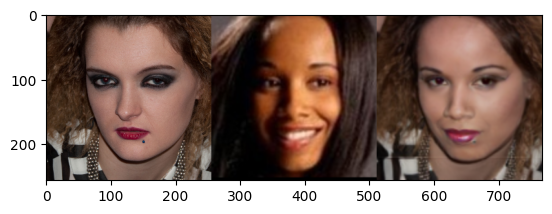

torch.Size([1, 3, 128, 128])


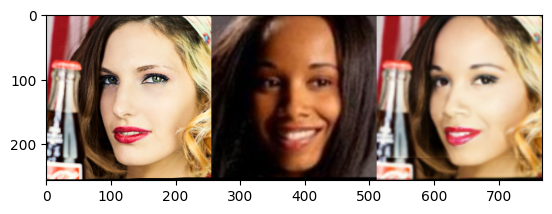

torch.Size([1, 3, 128, 128])


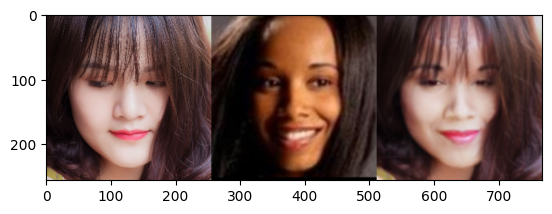

torch.Size([1, 3, 128, 128])


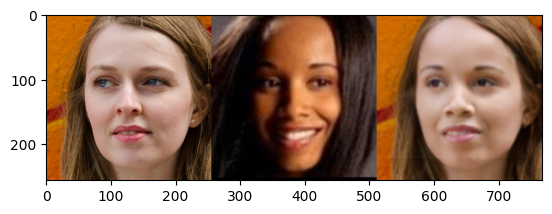

torch.Size([1, 3, 128, 128])


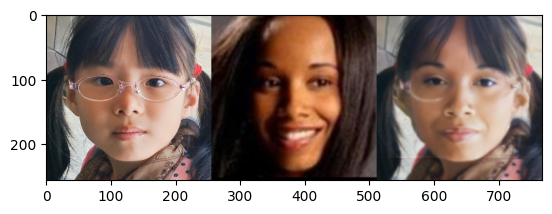

torch.Size([1, 3, 128, 128])


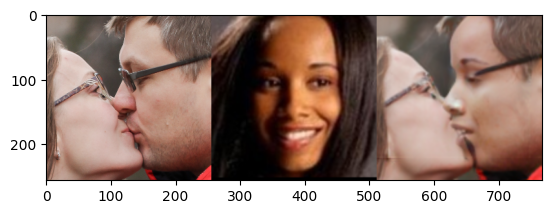

torch.Size([1, 3, 128, 128])


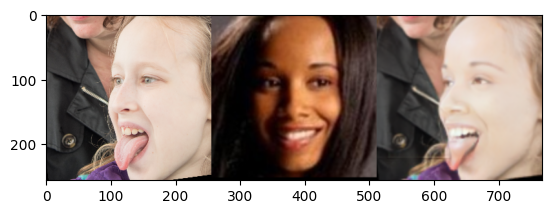

torch.Size([1, 3, 128, 128])


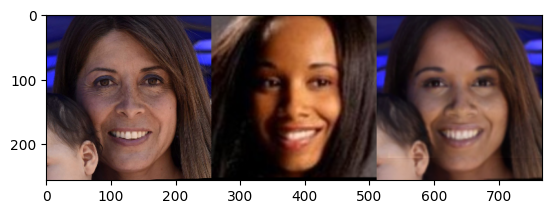

torch.Size([1, 3, 128, 128])


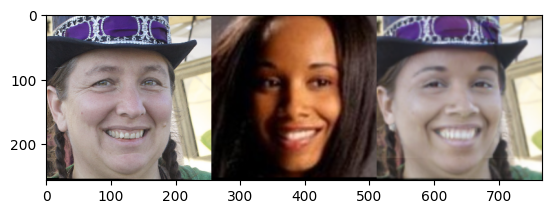

torch.Size([1, 3, 128, 128])


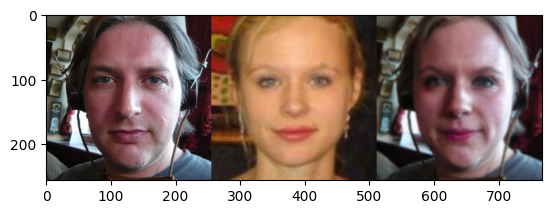

torch.Size([1, 3, 128, 128])


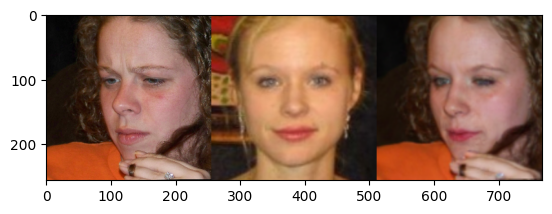

torch.Size([1, 3, 128, 128])


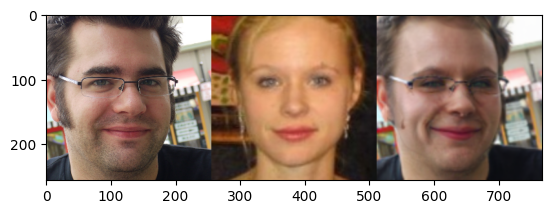

torch.Size([1, 3, 128, 128])


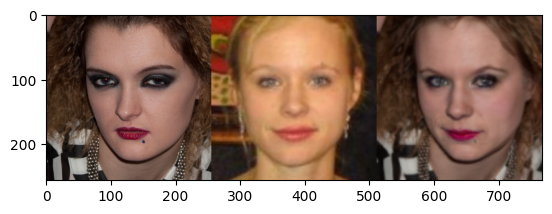

torch.Size([1, 3, 128, 128])


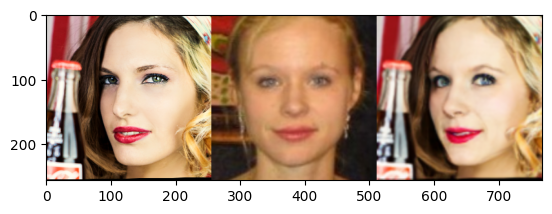

torch.Size([1, 3, 128, 128])


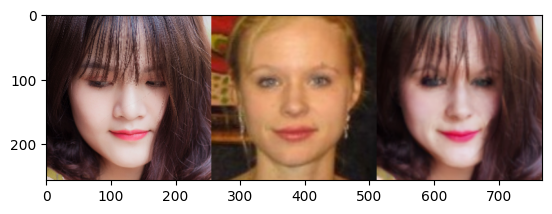

torch.Size([1, 3, 128, 128])


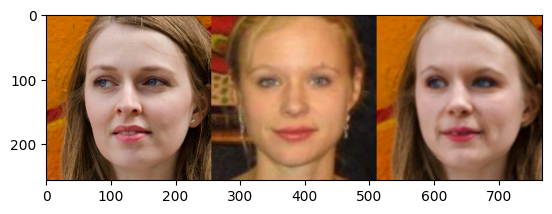

torch.Size([1, 3, 128, 128])


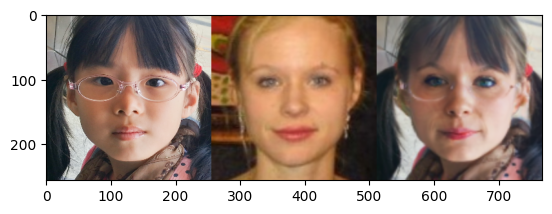

torch.Size([1, 3, 128, 128])


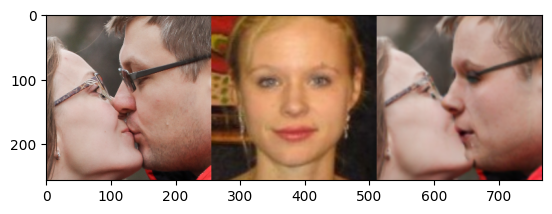

torch.Size([1, 3, 128, 128])


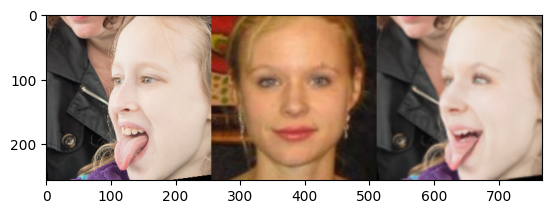

torch.Size([1, 3, 128, 128])


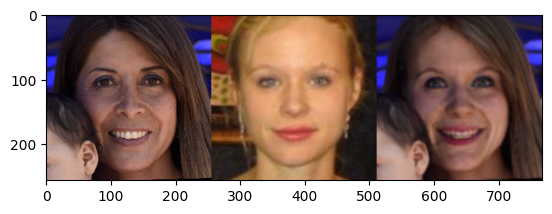

torch.Size([1, 3, 128, 128])


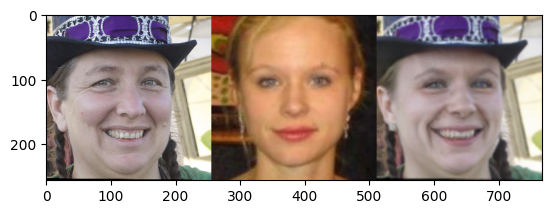

torch.Size([1, 3, 128, 128])


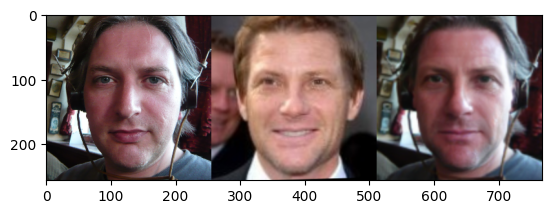

torch.Size([1, 3, 128, 128])


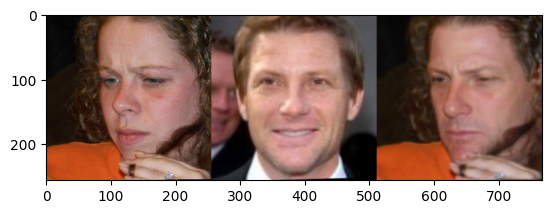

torch.Size([1, 3, 128, 128])


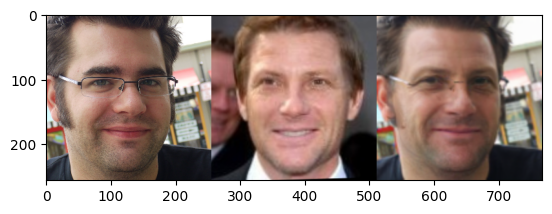

torch.Size([1, 3, 128, 128])


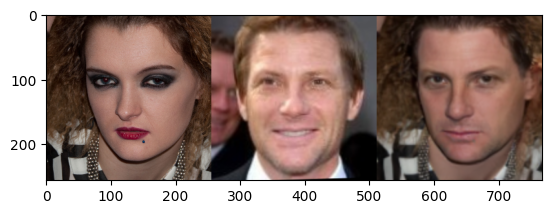

torch.Size([1, 3, 128, 128])


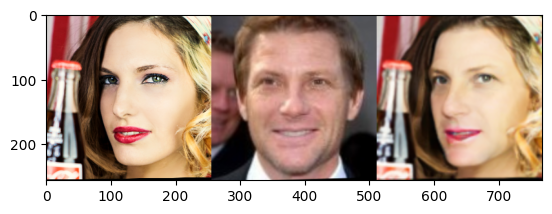

torch.Size([1, 3, 128, 128])


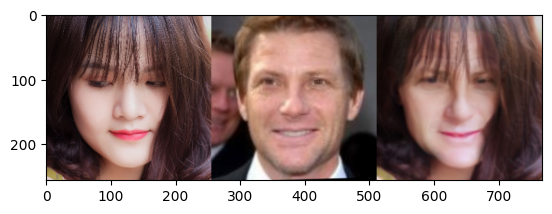

torch.Size([1, 3, 128, 128])


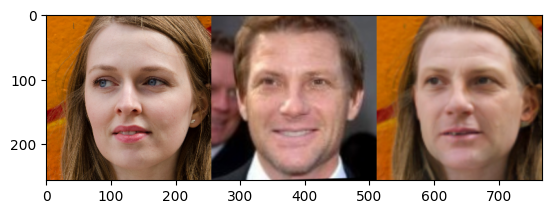

torch.Size([1, 3, 128, 128])


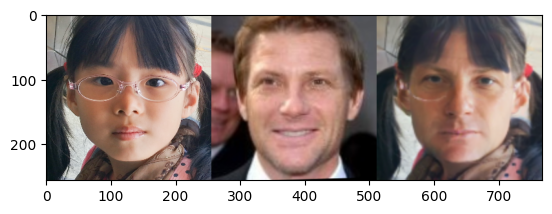

torch.Size([1, 3, 128, 128])


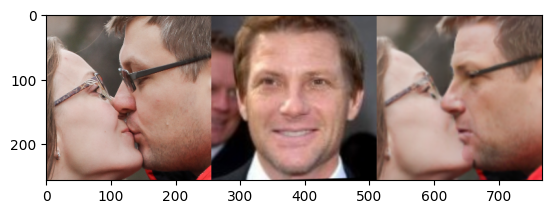

torch.Size([1, 3, 128, 128])


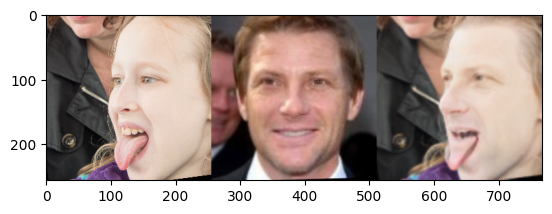

torch.Size([1, 3, 128, 128])


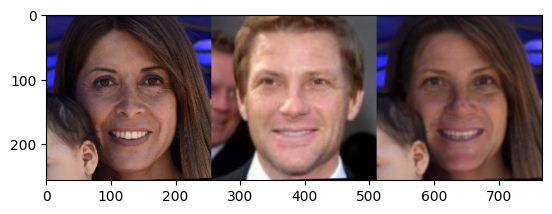

torch.Size([1, 3, 128, 128])


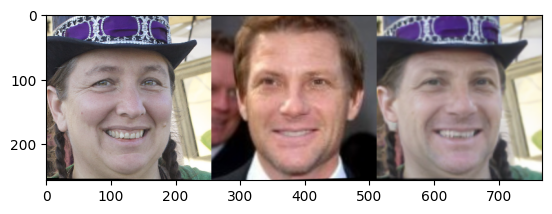

torch.Size([1, 3, 128, 128])


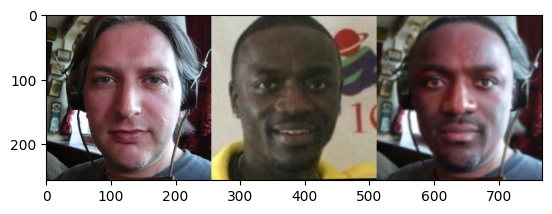

torch.Size([1, 3, 128, 128])


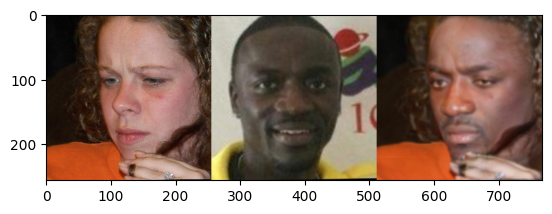

torch.Size([1, 3, 128, 128])


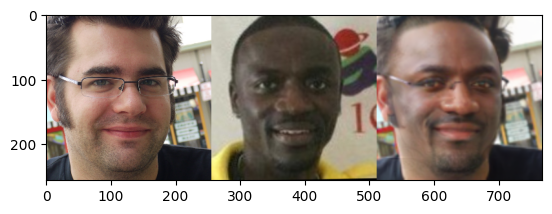

torch.Size([1, 3, 128, 128])


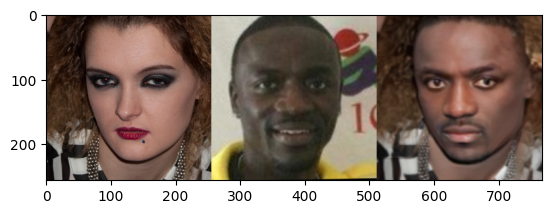

torch.Size([1, 3, 128, 128])


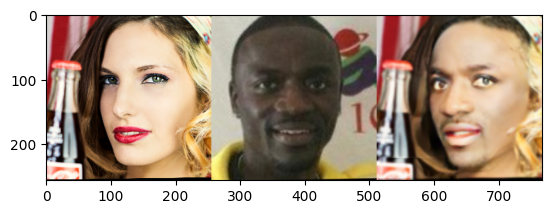

torch.Size([1, 3, 128, 128])


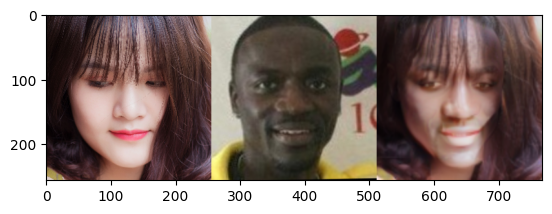

torch.Size([1, 3, 128, 128])


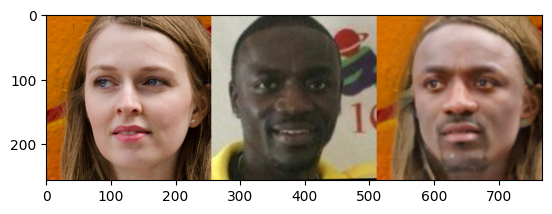

torch.Size([1, 3, 128, 128])


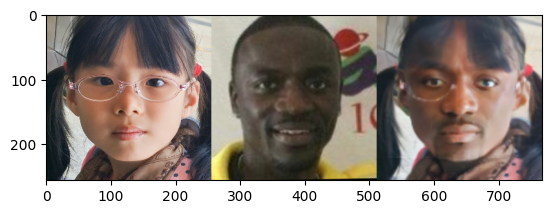

torch.Size([1, 3, 128, 128])


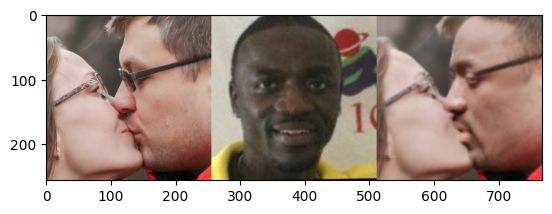

torch.Size([1, 3, 128, 128])


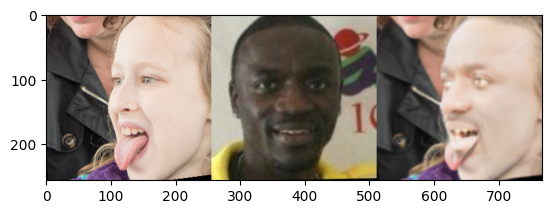

torch.Size([1, 3, 128, 128])


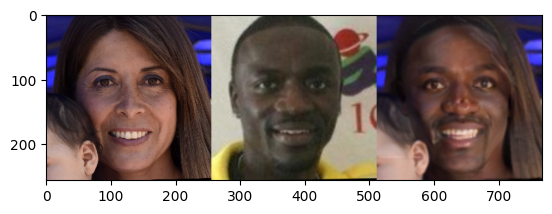

torch.Size([1, 3, 128, 128])


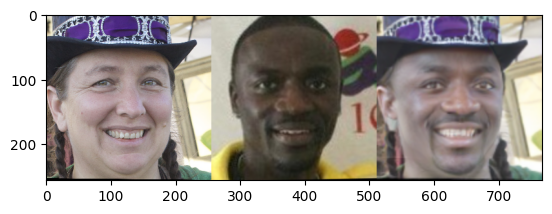

torch.Size([1, 3, 128, 128])


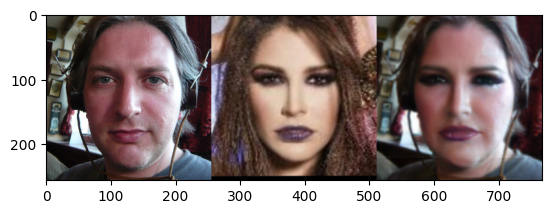

torch.Size([1, 3, 128, 128])


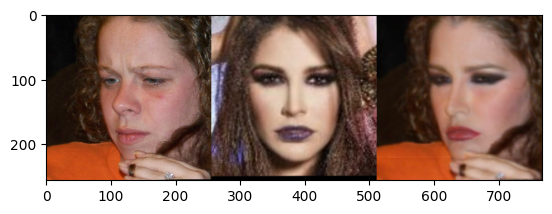

torch.Size([1, 3, 128, 128])


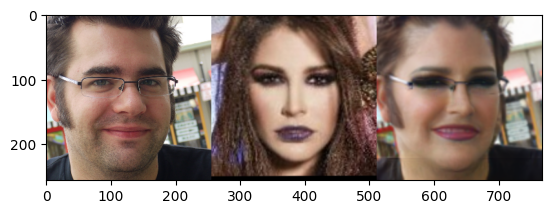

torch.Size([1, 3, 128, 128])


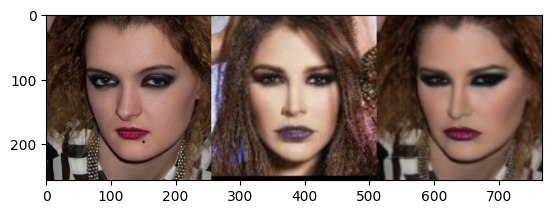

torch.Size([1, 3, 128, 128])


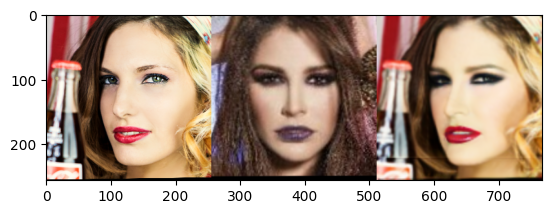

torch.Size([1, 3, 128, 128])


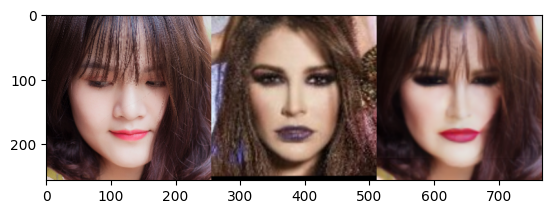

torch.Size([1, 3, 128, 128])


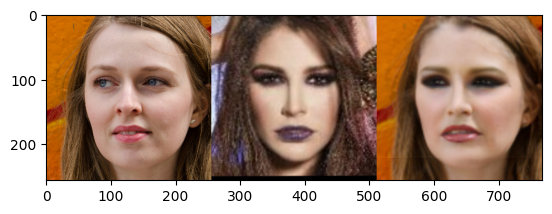

torch.Size([1, 3, 128, 128])


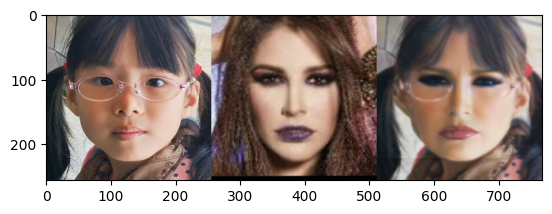

torch.Size([1, 3, 128, 128])


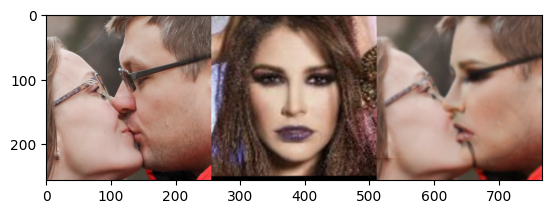

torch.Size([1, 3, 128, 128])


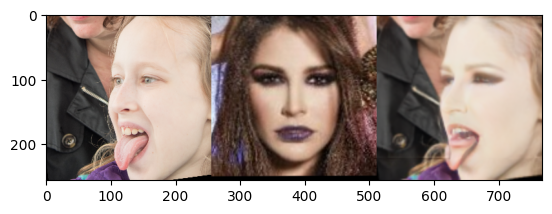

torch.Size([1, 3, 128, 128])


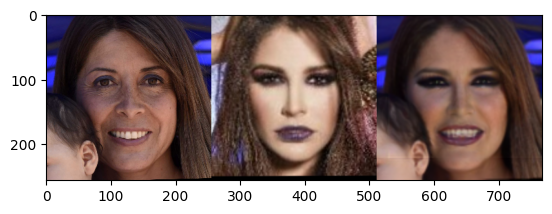

torch.Size([1, 3, 128, 128])


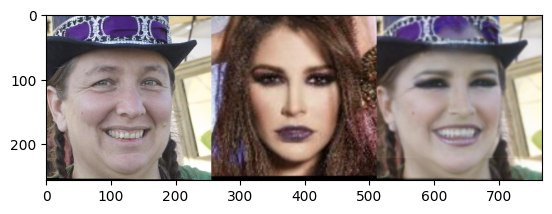

In [6]:
db_path = './examples'
source_img_list = get_imgfiles(os.path.join(db_path,'source'))
target_img_list = get_imgfiles(os.path.join(db_path,'target'))
_cnt = 0
with torch.no_grad():
    for src_path in source_img_list:
        for tar_path in target_img_list:
            src_rgb_img = Image.open(src_path).convert('RGB')
            tar_rgb_img = Image.open(tar_path).convert('RGB')

            src_face = s_transform(src_rgb_img)
            tar_face = t_transform(tar_rgb_img)
            src_face = torch.unsqueeze(src_face,axis=0).cuda()
            tar_face = torch.unsqueeze(tar_face,axis=0).cuda()
            #src_face= ((F.interpolate(src_face, (112, 112), mode='bilinear') * 255.0) / 127.5) - 1.0

            source_code = arcface(src_face)
            swapped_face = torch_inswapper(tar_face,source_code)
        
            print(np.shape(swapped_face))
            #pdb.set_trace()
            swapped_face = swapped_face.cpu().numpy().transpose(0, 2, 3, 1)[0]
            swapped_face = cv2.resize(np.float64(swapped_face*255),(256,256))
            swapped_face = np.int64(swapped_face)
            #pdb.set_trace()
            frame = np.concatenate((np.array(tar_rgb_img),np.array(src_rgb_img),swapped_face),axis=1)
            plt.imshow(frame)
            plt.show()
            _cnt +=1
            if _cnt==10:
                break

